In [1]:
import pandas as pd
import geopandas as gpd
from geopandas.tools import geocode
import matplotlib.pyplot as plt

pd.options.display.max_colwidth= 200
pd.set_option('display.max_rows', 20)

C:\Users\Ricardo\Anaconda3\lib\site-packages\pandas\compat\_optional.py:138: UserWarning: Pandas requires version '2.7.0' or newer of 'numexpr' (version '2.6.8' currently installed).
  warnings.warn(msg, UserWarning)


In [83]:
data = pd.read_csv('~/Documents/R-Projetos/Exploratory-Data-Analysis-Bancarization/data/raw/Agencias.csv', sep=',')

### Correcting 2 addresses

In [84]:
# Changing CEP value to none because it's pointing to another municipality
data.iloc[9993, 11] = None
data.iloc[9993, 10] = 'JARDIM PAULISTA'

In [85]:
data.iloc[9993]

CnpjBase                               90400888
CnpjSequencial                             1590
CnpjDv                                       95
NomeIf            BANCO SANTANDER (BRASIL) S.A.
Segmento                         Banco Múltiplo
CodigoCompe                              3563.0
NomeAgencia                   SP-AV. 9 DE JULHO
Endereco                 RUA ESTADOS UNIDOS,746
Numero                                      NaN
Complemento                                 NaN
Bairro                          JARDIM PAULISTA
Cep                                        None
MunicipioIbge                           3550308
Municipio                             SAO PAULO
UF                                           SP
DataInicio                           30/04/2009
DDD                                        11.0
Telefone                              8705221.0
Posicao                              28/12/2021
Name: 9993, dtype: object

In [86]:
# Changing 5.460 to 5460
data.iloc[5928, 7] = 'AV. CUPECÊ, 5460'

In [87]:
data.iloc[5928]

CnpjBase                    60701190
CnpjSequencial                  2745
CnpjDv                            73
NomeIf            ITAÚ UNIBANCO S.A.
Segmento              Banco Múltiplo
CodigoCompe                   6507.0
NomeAgencia         SP/JARDIM MIRIAM
Endereco            AV. CUPECÊ, 5460
Numero                           NaN
Complemento                      NaN
Bairro                 CIDADE ADEMAR
Cep                        04366-001
MunicipioIbge                3550308
Municipio                  SAO PAULO
UF                                SP
DataInicio                29/12/2005
DDD                             11.0
Telefone                  30034828.0
Posicao                   28/12/2021
Name: 5928, dtype: object

In [3]:
data

,CnpjBase,CnpjSequencial,CnpjDv,NomeIf,Segmento,CodigoCompe,NomeAgencia,Endereco,Numero,Complemento,Bairro,Cep,MunicipioIbge,Municipio,UF,DataInicio,DDD,Telefone,Posicao
0,60746948,9648,55,BANCO BRADESCO S.A.,Banco Múltiplo,7059.0,"TOP TIER - BRASILIA, DF","SETOR SCS, QD 2, BL A 81, S/N, 1º PAV",NaN,EDIF BRADESCO BRASILIA,ASA SUL,70329-900,5300108,BRASILIA,DF,12/11/2018,61.0,32181117.0,28/12/2021
1,360305,4791,24,CAIXA ECONOMICA FEDERAL,Caixa Econômica Federal,4791.0,"ITARIRI, SP",AVENIDA JOSE FERREIRA FRANCO,NaN,NaN,CENTRO,11760-000,3523305,ITARIRI,SP,14/06/2013,13.0,34188100.0,28/12/2021
2,60701190,4669,95,ITAÚ UNIBANCO S.A.,Banco Múltiplo,9691.0,PERSONNALITE AMERICANA,RUA WASHINGTON LUIZ,420,NaN,CENTRO,13465-520,3501608,AMERICANA,SP,10/07/2012,11.0,30034828.0,28/12/2021
3,0,7687,23,BANCO DO BRASIL S.A.,Banco Múltiplo,9190.0,ESCR.EXC.RUDGE RAMOS,"AV.SENADOR VERGUEIRO,4285",NaN,SALA B,R RAMOS,09605-000,3548708,SAO BERNARDO DO CAMPO,SP,21/09/2018,11.0,40033001.0,28/12/2021
4,0,7686,42,BANCO DO BRASIL S.A.,Banco Múltiplo,9189.0,ESCR.EXC.S.B.CAMPO,"AV.SENADOR VERGUEIRO,4285",NaN,SALA A,R FRAMOS,09605-000,3548708,SAO BERNARDO DO CAMPO,SP,21/09/2018,11.0,40033001.0,28/12/2021
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
18296,0,6639,72,BANCO DO BRASIL S.A.,Banco Múltiplo,6968.0,AVENIDA PORTUGAL,AVENIDA PORTUGAL,777,NaN,CENTRO,09041-320,3547809,SANTO ANDRE,SP,30/11/2009,11.0,49902818.0,28/12/2021
18297,90400888,2267,1,BANCO SANTANDER (BRASIL) S.A.,Banco Múltiplo,4362.0,001-4362 RIO-GRAJAU,RUA BARAO DE MESQUITA,625,LJ A/B/C,ANDARAI,20540-155,3304557,RIO DE JANEIRO,RJ,30/04/2009,21.0,32944750.0,28/12/2021
18298,60701190,928,90,ITAÚ UNIBANCO S.A.,Banco Múltiplo,530.0,RIO/MERCADO S.SEBASTIAO,AV. BRASIL,23800,/RUA DA SOJA 82,VIGARIO GERAL,21012-350,3304557,RIO DE JANEIRO,RJ,26/04/1956,11.0,30034828.0,28/12/2021
18299,60701190,308,60,ITAÚ UNIBANCO S.A.,Banco Múltiplo,71.0,MANAUS/EDUARDO RIBEIRO-AM,"AVENIDA EDUARDO RIBEIRO, 399",NaN,NaN,CENTRO,69010-000,1302603,MANAUS,AM,27/01/1970,11.0,30034828.0,28/12/2021


In [88]:
data_sp = data[(data['UF'] == 'SP') & (data['Municipio'] == 'SAO PAULO')]

In [56]:
data_sp

,CnpjBase,CnpjSequencial,CnpjDv,NomeIf,Segmento,CodigoCompe,NomeAgencia,Endereco,Numero,Complemento,Bairro,Cep,MunicipioIbge,Municipio,UF,DataInicio,DDD,Telefone,Posicao
24,30306294,16,21,BANCO BTG PACTUAL S.A.,Banco Múltiplo,30.0,BAAS,AVENIDA BRIGADEIRO FARIA LIMA,3064,12º ANDAR,ITAIM BIBI,01425-010,3550308,SAO PAULO,SP,07/08/2020,11.0,3383.0,28/12/2021
34,58160789,120,53,BANCO SAFRA S.A.,Banco Múltiplo,140.0,TATUAPE,"RUA CANTAGALO, CONJS. 501 A 505 BLOCO A",NaN,"LOJAS 1, 2, 3, 4 E 5 DO PAVIMENTO TÉRREO",VILA GOMES CARDIM,03319-000,3550308,SAO PAULO,SP,28/03/1994,11.0,20956150.0,28/12/2021
39,58160789,200,72,BANCO SAFRA S.A.,Banco Múltiplo,282.0,DIGITAL,AVENIDA PAULISTA,1450,17º AND CONJ.175 - COND. CETENCO PLAZA TORRE NORTE,BELA VISTA,01310-930,3550308,SAO PAULO,SP,03/12/2019,11.0,31757575.0,28/12/2021
48,90400888,775,28,BANCO SANTANDER (BRASIL) S.A.,Banco Múltiplo,2073.0,ANTILHAS-SP-SP,RUA AUGUSTA,129,LJ / SLJ,CERQUEIRA CESAR,01413-100,3550308,SAO PAULO,SP,31/08/2006,11.0,30626366.0,28/12/2021
58,11703662,1,44,TRAVELEX BANCO DE CÂMBIO S.A.,Banco de Câmbio,NaN,MATRIZ,AV ENG. LUIZ CARLOS BERRINI,NaN,5º ANDAR - CONJS 51 E 52 - EDIFÍCIO BERRINI ONE,CIDADE MONÇÕES,04571-010,3550308,SAO PAULO,SP,01/03/2016,11.0,36141100.0,28/12/2021
72,69720910,1,45,CCB BRASIL ARRENDAMENTO MERCANTIL S/A,Sociedade de Arrendamento Mercantil,NaN,MATRIZ,AVENIDA BRIGADEIRO FARIA LIMA,3064,"2º ANDAR, SALA 6",ITAIM BIBI,04538-132,3550308,SAO PAULO,SP,02/10/2018,NaN,NaN,28/12/2021
89,52937216,1,81,BEXS CORRETORA DE CÂMBIO S/A,Sociedade Corretora de Câmbio,NaN,MATRIZ,AVENIDA DAS NAÇÕES UNIDAS,14401,11 ANDAR,BROOKLIN PAULISTA,04578-901,3550308,SAO PAULO,SP,20/08/1996,11.0,27125300.0,28/12/2021
96,90400888,1600,0,BANCO SANTANDER (BRASIL) S.A.,Banco Múltiplo,4341.0,001-4341 SP-AV.PENHA DE FRANCA,R DR JOAO RIBEIRO,NaN,NaN,PENHA DE FRANCA,03634-010,3550308,SAO PAULO,SP,30/04/2009,NaN,8.0,28/12/2021
108,90400888,807,40,BANCO SANTANDER (BRASIL) S.A.,Banco Múltiplo,2270.0,001 2270 PRIVATE,AV P JUSC. KUBITSCHEK,NaN,7ANDAR,ITAIM BIBI,04543-011,3550308,SAO PAULO,SP,31/08/2006,11.0,35535027.0,28/12/2021
109,90400888,2555,66,BANCO SANTANDER (BRASIL) S.A.,Banco Múltiplo,987.0,001 0987 PARI I,PCA EDUARDO RUDGE,NaN,NaN,PARI,03028-010,3550308,SAO PAULO,SP,30/12/2010,11.0,26121500.0,28/12/2021


In [89]:
data_sp["endereco_completo"] = data_sp["Endereco"].fillna('') + ", " + data_sp["Numero"].fillna('') + ", " + data_sp["Bairro"].fillna('') + ", " + data_sp["Cep"].fillna('') + ", " + data_sp["Municipio"].fillna('')

C:\Users\Ricardo\Anaconda3\lib\site-packages\ipykernel_launcher.py:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  """Entry point for launching an IPython kernel.


In [90]:
data_sp[data_sp['endereco_completo'].isnull()]

,CnpjBase,CnpjSequencial,CnpjDv,NomeIf,Segmento,CodigoCompe,NomeAgencia,Endereco,Numero,Complemento,Bairro,Cep,MunicipioIbge,Municipio,UF,DataInicio,DDD,Telefone,Posicao,endereco_completo


In [91]:
gdf_agencias_sp = geocode(data_sp["endereco_completo"], provider="arcgis", user_agent="autogis_xx", timeout=4)

In [92]:
gdf_agencias_sp_copy = gdf_agencias_sp.copy(deep=True)

In [93]:
gdf_agencias_sp['lon'] = gdf_agencias_sp['geometry'].x
gdf_agencias_sp['lat'] = gdf_agencias_sp['geometry'].y

In [62]:
gdf_agencias_sp

,geometry,address,lon,lat
24,POINT (-46.68407 -23.58329),"Avenida Brigadeiro Faria Lima 3064, Itaim Bibi, São Paulo, 01451-000",-46.684070,-23.583290
34,POINT (-46.56915 -23.54616),"Rua Cantagalo 501, Tatuapé, São Paulo, 03319-000",-46.569150,-23.546160
39,POINT (-46.65516 -23.56235),"Avenida Paulista 1450, Bela Vista, São Paulo, 01310-100",-46.655160,-23.562350
48,POINT (-46.66701 -23.56462),"Rua Augusta, Jardim Paulista, São Paulo, 01413-100",-46.667015,-23.564621
58,POINT (-46.69184 -23.60271),"Avenida Engenheiro Luís Carlos Berrini, Itaim Bibi, São Paulo, 04571-010",-46.691840,-23.602715
72,POINT (-46.68407 -23.58329),"Avenida Brigadeiro Faria Lima 3064, Itaim Bibi, São Paulo, 01451-000",-46.684070,-23.583290
89,POINT (-46.70430 -23.62449),"Avenida das Nações Unidas 14401, Santo Amaro, São Paulo, 04795-100",-46.704300,-23.624490
96,POINT (-46.54756 -23.52436),"Rua Doutor João Ribeiro, Penha, São Paulo, 03634-010",-46.547559,-23.524363
108,POINT (-46.68628 -23.59163),"Avenida Presidente Juscelino Kubitschek, Itaim Bibi, São Paulo, 04543-011",-46.686285,-23.591626
109,POINT (-46.61585 -23.53147),Praça Eduardo Rudge,-46.615850,-23.531470


In [94]:
gdf_agencias_sp = gdf_agencias_sp[['address', 'lon', 'lat']]

In [95]:
join = gdf_agencias_sp.join(data_sp)

In [65]:
join

,address,lon,lat,CnpjBase,CnpjSequencial,CnpjDv,NomeIf,Segmento,CodigoCompe,NomeAgencia,...,Bairro,Cep,MunicipioIbge,Municipio,UF,DataInicio,DDD,Telefone,Posicao,endereco_completo
24,"Avenida Brigadeiro Faria Lima 3064, Itaim Bibi, São Paulo, 01451-000",-46.684070,-23.583290,30306294,16,21,BANCO BTG PACTUAL S.A.,Banco Múltiplo,30.0,BAAS,...,ITAIM BIBI,01425-010,3550308,SAO PAULO,SP,07/08/2020,11.0,3383.0,28/12/2021,"AVENIDA BRIGADEIRO FARIA LIMA, 3064, ITAIM BIBI, 01425-010, SAO PAULO"
34,"Rua Cantagalo 501, Tatuapé, São Paulo, 03319-000",-46.569150,-23.546160,58160789,120,53,BANCO SAFRA S.A.,Banco Múltiplo,140.0,TATUAPE,...,VILA GOMES CARDIM,03319-000,3550308,SAO PAULO,SP,28/03/1994,11.0,20956150.0,28/12/2021,"RUA CANTAGALO, CONJS. 501 A 505 BLOCO A, , VILA GOMES CARDIM, 03319-000, SAO PAULO"
39,"Avenida Paulista 1450, Bela Vista, São Paulo, 01310-100",-46.655160,-23.562350,58160789,200,72,BANCO SAFRA S.A.,Banco Múltiplo,282.0,DIGITAL,...,BELA VISTA,01310-930,3550308,SAO PAULO,SP,03/12/2019,11.0,31757575.0,28/12/2021,"AVENIDA PAULISTA, 1450, BELA VISTA, 01310-930, SAO PAULO"
48,"Rua Augusta, Jardim Paulista, São Paulo, 01413-100",-46.667015,-23.564621,90400888,775,28,BANCO SANTANDER (BRASIL) S.A.,Banco Múltiplo,2073.0,ANTILHAS-SP-SP,...,CERQUEIRA CESAR,01413-100,3550308,SAO PAULO,SP,31/08/2006,11.0,30626366.0,28/12/2021,"RUA AUGUSTA, 129, CERQUEIRA CESAR, 01413-100, SAO PAULO"
58,"Avenida Engenheiro Luís Carlos Berrini, Itaim Bibi, São Paulo, 04571-010",-46.691840,-23.602715,11703662,1,44,TRAVELEX BANCO DE CÂMBIO S.A.,Banco de Câmbio,NaN,MATRIZ,...,CIDADE MONÇÕES,04571-010,3550308,SAO PAULO,SP,01/03/2016,11.0,36141100.0,28/12/2021,"AV ENG. LUIZ CARLOS BERRINI, , CIDADE MONÇÕES, 04571-010, SAO PAULO"
72,"Avenida Brigadeiro Faria Lima 3064, Itaim Bibi, São Paulo, 01451-000",-46.684070,-23.583290,69720910,1,45,CCB BRASIL ARRENDAMENTO MERCANTIL S/A,Sociedade de Arrendamento Mercantil,NaN,MATRIZ,...,ITAIM BIBI,04538-132,3550308,SAO PAULO,SP,02/10/2018,NaN,NaN,28/12/2021,"AVENIDA BRIGADEIRO FARIA LIMA, 3064, ITAIM BIBI, 04538-132, SAO PAULO"
89,"Avenida das Nações Unidas 14401, Santo Amaro, São Paulo, 04795-100",-46.704300,-23.624490,52937216,1,81,BEXS CORRETORA DE CÂMBIO S/A,Sociedade Corretora de Câmbio,NaN,MATRIZ,...,BROOKLIN PAULISTA,04578-901,3550308,SAO PAULO,SP,20/08/1996,11.0,27125300.0,28/12/2021,"AVENIDA DAS NAÇÕES UNIDAS, 14401, BROOKLIN PAULISTA, 04578-901, SAO PAULO"
96,"Rua Doutor João Ribeiro, Penha, São Paulo, 03634-010",-46.547559,-23.524363,90400888,1600,0,BANCO SANTANDER (BRASIL) S.A.,Banco Múltiplo,4341.0,001-4341 SP-AV.PENHA DE FRANCA,...,PENHA DE FRANCA,03634-010,3550308,SAO PAULO,SP,30/04/2009,NaN,8.0,28/12/2021,"R DR JOAO RIBEIRO, , PENHA DE FRANCA, 03634-010, SAO PAULO"
108,"Avenida Presidente Juscelino Kubitschek, Itaim Bibi, São Paulo, 04543-011",-46.686285,-23.591626,90400888,807,40,BANCO SANTANDER (BRASIL) S.A.,Banco Múltiplo,2270.0,001 2270 PRIVATE,...,ITAIM BIBI,04543-011,3550308,SAO PAULO,SP,31/08/2006,11.0,35535027.0,28/12/2021,"AV P JUSC. KUBITSCHEK, , ITAIM BIBI, 04543-011, SAO PAULO"
109,Praça Eduardo Rudge,-46.615850,-23.531470,90400888,2555,66,BANCO SANTANDER (BRASIL) S.A.,Banco Múltiplo,987.0,001 0987 PARI I,...,PARI,03028-010,3550308,SAO PAULO,SP,30/12/2010,11.0,26121500.0,28/12/2021,"PCA EDUARDO RUDGE, , PARI, 03028-010, SAO PAULO"


In [96]:
join.to_csv('C:/Users/Ricardo/Documents/R-Projetos/Exploratory-Data-Analysis-Bancarization/data/processed/agencias_latlong.csv', sep=';', encoding='utf-8', index=False)

In [97]:
gdf_agencias_sp = pd.read_csv('C:/Users/Ricardo/Documents/R-Projetos/Exploratory-Data-Analysis-Bancarization/data/processed/agencias_latlong.csv', sep=';')

In [68]:
gdf_agencias_sp

,address,lon,lat,CnpjBase,CnpjSequencial,CnpjDv,NomeIf,Segmento,CodigoCompe,NomeAgencia,...,Bairro,Cep,MunicipioIbge,Municipio,UF,DataInicio,DDD,Telefone,Posicao,endereco_completo
0,"Avenida Brigadeiro Faria Lima 3064, Itaim Bibi, São Paulo, 01451-000",-46.684070,-23.583290,30306294,16,21,BANCO BTG PACTUAL S.A.,Banco Múltiplo,30.0,BAAS,...,ITAIM BIBI,01425-010,3550308,SAO PAULO,SP,07/08/2020,11.0,3383.0,28/12/2021,"AVENIDA BRIGADEIRO FARIA LIMA, 3064, ITAIM BIBI, 01425-010, SAO PAULO"
1,"Rua Cantagalo 501, Tatuapé, São Paulo, 03319-000",-46.569150,-23.546160,58160789,120,53,BANCO SAFRA S.A.,Banco Múltiplo,140.0,TATUAPE,...,VILA GOMES CARDIM,03319-000,3550308,SAO PAULO,SP,28/03/1994,11.0,20956150.0,28/12/2021,"RUA CANTAGALO, CONJS. 501 A 505 BLOCO A, , VILA GOMES CARDIM, 03319-000, SAO PAULO"
2,"Avenida Paulista 1450, Bela Vista, São Paulo, 01310-100",-46.655160,-23.562350,58160789,200,72,BANCO SAFRA S.A.,Banco Múltiplo,282.0,DIGITAL,...,BELA VISTA,01310-930,3550308,SAO PAULO,SP,03/12/2019,11.0,31757575.0,28/12/2021,"AVENIDA PAULISTA, 1450, BELA VISTA, 01310-930, SAO PAULO"
3,"Rua Augusta, Jardim Paulista, São Paulo, 01413-100",-46.667015,-23.564621,90400888,775,28,BANCO SANTANDER (BRASIL) S.A.,Banco Múltiplo,2073.0,ANTILHAS-SP-SP,...,CERQUEIRA CESAR,01413-100,3550308,SAO PAULO,SP,31/08/2006,11.0,30626366.0,28/12/2021,"RUA AUGUSTA, 129, CERQUEIRA CESAR, 01413-100, SAO PAULO"
4,"Avenida Engenheiro Luís Carlos Berrini, Itaim Bibi, São Paulo, 04571-010",-46.691840,-23.602715,11703662,1,44,TRAVELEX BANCO DE CÂMBIO S.A.,Banco de Câmbio,NaN,MATRIZ,...,CIDADE MONÇÕES,04571-010,3550308,SAO PAULO,SP,01/03/2016,11.0,36141100.0,28/12/2021,"AV ENG. LUIZ CARLOS BERRINI, , CIDADE MONÇÕES, 04571-010, SAO PAULO"
5,"Avenida Brigadeiro Faria Lima 3064, Itaim Bibi, São Paulo, 01451-000",-46.684070,-23.583290,69720910,1,45,CCB BRASIL ARRENDAMENTO MERCANTIL S/A,Sociedade de Arrendamento Mercantil,NaN,MATRIZ,...,ITAIM BIBI,04538-132,3550308,SAO PAULO,SP,02/10/2018,NaN,NaN,28/12/2021,"AVENIDA BRIGADEIRO FARIA LIMA, 3064, ITAIM BIBI, 04538-132, SAO PAULO"
6,"Avenida das Nações Unidas 14401, Santo Amaro, São Paulo, 04795-100",-46.704300,-23.624490,52937216,1,81,BEXS CORRETORA DE CÂMBIO S/A,Sociedade Corretora de Câmbio,NaN,MATRIZ,...,BROOKLIN PAULISTA,04578-901,3550308,SAO PAULO,SP,20/08/1996,11.0,27125300.0,28/12/2021,"AVENIDA DAS NAÇÕES UNIDAS, 14401, BROOKLIN PAULISTA, 04578-901, SAO PAULO"
7,"Rua Doutor João Ribeiro, Penha, São Paulo, 03634-010",-46.547559,-23.524363,90400888,1600,0,BANCO SANTANDER (BRASIL) S.A.,Banco Múltiplo,4341.0,001-4341 SP-AV.PENHA DE FRANCA,...,PENHA DE FRANCA,03634-010,3550308,SAO PAULO,SP,30/04/2009,NaN,8.0,28/12/2021,"R DR JOAO RIBEIRO, , PENHA DE FRANCA, 03634-010, SAO PAULO"
8,"Avenida Presidente Juscelino Kubitschek, Itaim Bibi, São Paulo, 04543-011",-46.686285,-23.591626,90400888,807,40,BANCO SANTANDER (BRASIL) S.A.,Banco Múltiplo,2270.0,001 2270 PRIVATE,...,ITAIM BIBI,04543-011,3550308,SAO PAULO,SP,31/08/2006,11.0,35535027.0,28/12/2021,"AV P JUSC. KUBITSCHEK, , ITAIM BIBI, 04543-011, SAO PAULO"
9,Praça Eduardo Rudge,-46.615850,-23.531470,90400888,2555,66,BANCO SANTANDER (BRASIL) S.A.,Banco Múltiplo,987.0,001 0987 PARI I,...,PARI,03028-010,3550308,SAO PAULO,SP,30/12/2010,11.0,26121500.0,28/12/2021,"PCA EDUARDO RUDGE, , PARI, 03028-010, SAO PAULO"


In [98]:
# Set crs to use degrees in the first moment
# https://gis.stackexchange.com/questions/345071/matching-x-and-y-axis-coordinates-of-two-geopandas-geometries-to-overlay-them
gdf_agencias_sp_points = gpd.GeoDataFrame(gdf_agencias_sp, geometry=gpd.points_from_xy(gdf_agencias_sp['lon'], gdf_agencias_sp['lat']), crs=4326)

In [99]:
# Then, set the crs of points to the crs of shapefile map which is in meters
gdf_agencias_sp_points = gdf_agencias_sp_points.to_crs(sp_shp.crs)

In [72]:
gdf_agencias_sp_points.crs

<Projected CRS: EPSG:29193>
Name: SAD69 / UTM zone 23S
Axis Info [cartesian]:
- E[east]: Easting (metre)
- N[north]: Northing (metre)
Area of Use:
- name: Brazil - between 48°W and 42°W, northern and southern hemispheres, onshore and offshore.
- bounds: (-48.0, -33.5, -42.0, 5.13)
Coordinate Operation:
- name: UTM zone 23S
- method: Transverse Mercator
Datum: South American Datum 1969
- Ellipsoid: GRS 1967 Modified
- Prime Meridian: Greenwich

In [100]:
# Spatial join to get only the points inside polygon
gdf_agencias_sp_points_join = gpd.sjoin(gdf_agencias_sp_points, sp_shp, predicate='within')

In [74]:
gdf_agencias_sp_points_join

,address,lon,lat,CnpjBase,CnpjSequencial,CnpjDv,NomeIf,Segmento,CodigoCompe,NomeAgencia,...,index_right,CLASSID,FEATID,REVISIONNU,NOME_DIST,SIGLA_DIST,COD_DIST,COD_SUB,DATA_CRIAC,USUARIO_ID
0,"Avenida Brigadeiro Faria Lima 3064, Itaim Bibi, São Paulo, 01451-000",-46.684070,-23.583290,30306294,16,21,BANCO BTG PACTUAL S.A.,Banco Múltiplo,30.0,BAAS,...,49,4.0,8583474.0,1.0,ITAIM BIBI,IBI,35,11,2007-03-19,0.0
4,"Avenida Engenheiro Luís Carlos Berrini, Itaim Bibi, São Paulo, 04571-010",-46.691840,-23.602715,11703662,1,44,TRAVELEX BANCO DE CÂMBIO S.A.,Banco de Câmbio,NaN,MATRIZ,...,49,4.0,8583474.0,1.0,ITAIM BIBI,IBI,35,11,2007-03-19,0.0
5,"Avenida Brigadeiro Faria Lima 3064, Itaim Bibi, São Paulo, 01451-000",-46.684070,-23.583290,69720910,1,45,CCB BRASIL ARRENDAMENTO MERCANTIL S/A,Sociedade de Arrendamento Mercantil,NaN,MATRIZ,...,49,4.0,8583474.0,1.0,ITAIM BIBI,IBI,35,11,2007-03-19,0.0
8,"Avenida Presidente Juscelino Kubitschek, Itaim Bibi, São Paulo, 04543-011",-46.686285,-23.591626,90400888,807,40,BANCO SANTANDER (BRASIL) S.A.,Banco Múltiplo,2270.0,001 2270 PRIVATE,...,49,4.0,8583474.0,1.0,ITAIM BIBI,IBI,35,11,2007-03-19,0.0
14,"Rua Doutor Eduardo de Souza Aranha, Itaim Bibi, São Paulo, 04543-121",-46.675668,-23.588961,63062749,1,83,FATOR S.A. - CORRETORA DE VALORES,Sociedade Corretora de TVM,NaN,MATRIZ,...,49,4.0,8583474.0,1.0,ITAIM BIBI,IBI,35,11,2007-03-19,0.0
15,"Rua Joaquim Floriano 960, Itaim Bibi, São Paulo, 04534-004",-46.679270,-23.585740,1788147,1,50,H.COMMCOR DISTRIBUIDORA DE TÍTULOS E VALORES MOBILIÁRIOS LTDA.,Sociedade Distribuidora de TVM,NaN,MATRIZ,...,49,4.0,8583474.0,1.0,ITAIM BIBI,IBI,35,11,2007-03-19,0.0
17,"Avenida Presidente Juscelino Kubitschek 44, Itaim Bibi, São Paulo, 04543-000",-46.671290,-23.585123,62144175,1,20,BANCO PINE S.A.,Banco Múltiplo,1.0,MATRIZ,...,49,4.0,8583474.0,1.0,ITAIM BIBI,IBI,35,11,2007-03-19,0.0
18,"Avenida Presidente Juscelino Kubitschek, Itaim Bibi, São Paulo, 04543-011",-46.680164,-23.590297,58160789,176,8,BANCO SAFRA S.A.,Banco Múltiplo,198.0,JK,...,49,4.0,8583474.0,1.0,ITAIM BIBI,IBI,35,11,2007-03-19,0.0
22,"Avenida Brigadeiro Faria Lima 3144, Itaim Bibi, São Paulo, 01451-000",-46.683700,-23.584000,90400888,2873,36,BANCO SANTANDER (BRASIL) S.A.,Banco Múltiplo,1696.0,001 1696 SELECT FARIA LIMA SP,...,49,4.0,8583474.0,1.0,ITAIM BIBI,IBI,35,11,2007-03-19,0.0
23,"Avenida Brigadeiro Faria Lima, Itaim Bibi, São Paulo, 04538-132",-46.682274,-23.587956,69720894,1,90,CCB BRASIL DISTRIBUIDORA DE TÍTULOS E VALORES MOBILIÁRIOS S.A.,Sociedade Distribuidora de TVM,NaN,MATRIZ,...,49,4.0,8583474.0,1.0,ITAIM BIBI,IBI,35,11,2007-03-19,0.0


In [101]:
within_sp = gdf_agencias_sp_points[gdf_agencias_sp_points.geometry.within(sp_shp.geometry.unary_union)]
outside_sp = gdf_agencias_sp_points[~gdf_agencias_sp_points.geometry.within(sp_shp.geometry.unary_union)]

In [76]:
data_sp.filter(items = [9993], axis=0)

,CnpjBase,CnpjSequencial,CnpjDv,NomeIf,Segmento,CodigoCompe,NomeAgencia,Endereco,Numero,Complemento,Bairro,Cep,MunicipioIbge,Municipio,UF,DataInicio,DDD,Telefone,Posicao,endereco_completo
9993,90400888,1590,95,BANCO SANTANDER (BRASIL) S.A.,Banco Múltiplo,3563.0,SP-AV. 9 DE JULHO,"RUA ESTADOS UNIDOS,746",NaN,NaN,JARDIM AMERICA,None,3550308,SAO PAULO,SP,30/04/2009,11.0,8705221.0,28/12/2021,"RUA ESTADOS UNIDOS,746, , JARDIM AMERICA, , SAO PAULO"


In [102]:
outside_sp.endereco_completo

319    ALAMEDA RIO NEGRO, 585, 7º ANDAR, , CENTRO INDUSTRIAL, 06454-000, SAO PAULO
Name: endereco_completo, dtype: object

In [103]:
outside_sp

,address,lon,lat,CnpjBase,CnpjSequencial,CnpjDv,NomeIf,Segmento,CodigoCompe,NomeAgencia,...,Cep,MunicipioIbge,Municipio,UF,DataInicio,DDD,Telefone,Posicao,endereco_completo,geometry
319,"Alameda Rio Negro 585, Alphaville, Barueri, São Paulo, 06454-000",-46.848415,-23.499374,5883884,1,93,CSILATINA ARRENDAMENTO MERCANTIL S.A.,Sociedade de Arrendamento Mercantil,NaN,MATRIZ,...,06454-000,3550308,SAO PAULO,SP,01/10/2003,11.0,21989799.0,28/12/2021,"ALAMEDA RIO NEGRO, 585, 7º ANDAR, , CENTRO INDUSTRIAL, 06454-000, SAO PAULO",POINT (311298.261 7400029.420)


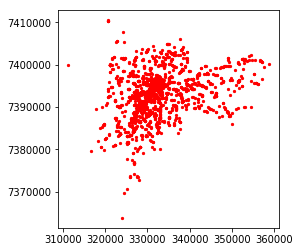

In [104]:
gdf_agencias_sp_points.plot(marker='o', color='red', markersize=5);

In [70]:
sp_shp = gpd.read_file('C:/Users/Ricardo/Documents/R-Projetos/Exploratory-Data-Analysis-Bancarization/data/raw/municipio_sp.shp')

In [53]:
sp_shp

,CLASSID,FEATID,REVISIONNU,NOME_DIST,SIGLA_DIST,COD_DIST,COD_SUB,DATA_CRIAC,USUARIO_ID,geometry
0,4.0,8583485.0,1.0,JOSE BONIFACIO,JBO,47,27,2007-03-19,0.0,"POLYGON ((352436.869 7394174.148, 352450.740 7..."
1,4.0,8583484.0,1.0,JD SAO LUIS,JDS,46,18,2007-03-19,0.0,"POLYGON ((320696.639 7383620.282, 320699.486 7..."
2,4.0,8583445.0,1.0,ARTUR ALVIM,AAL,5,21,2007-03-19,0.0,"POLYGON ((349461.276 7397764.525, 349461.935 7..."
3,4.0,8583479.0,1.0,JAGUARA,JAG,40,08,2007-03-19,0.0,"POLYGON ((320731.080 7400614.592, 320732.386 7..."
4,4.0,8583437.0,1.0,VILA PRUDENTE,VPR,93,29,2007-03-19,0.0,"POLYGON ((338651.039 7392203.484, 338654.034 7..."
...,...,...,...,...,...,...,...,...,...,...
91,4.0,8583433.0,1.0,VILA MARIA,VMR,89,07,2007-03-19,0.0,"POLYGON ((338228.823 7397145.610, 338216.895 7..."
92,4.0,8583434.0,1.0,VILA MARIANA,VMN,90,12,2007-03-19,0.0,"POLYGON ((331606.384 7389277.797, 331607.340 7..."
93,4.0,8583435.0,1.0,VILA MATILDE,VMT,91,21,2007-03-19,0.0,"POLYGON ((341994.993 7396441.620, 341979.394 7..."
94,4.0,8583412.0,1.0,SANTA CECILIA,SCE,69,09,2007-03-19,0.0,"POLYGON ((330220.609 7396091.962, 330226.819 7..."


In [29]:
# Área em km²
sp_shp['area'] = sp_shp.area / 10**6

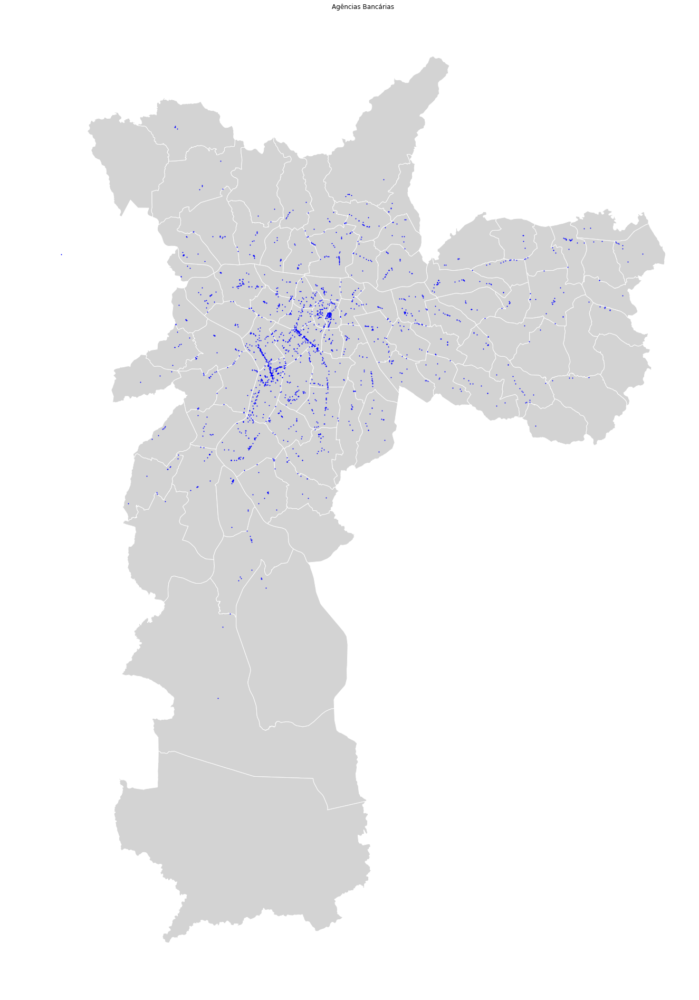

In [105]:
# Create a figure with one subplot
fig, ax = plt.subplots(figsize=(40,34))

# Set bg colors
ax.set(facecolor = "white")
fig.patch.set_facecolor('white')

# Plot polygons
sp_shp.plot(ax=ax, facecolor='lightgrey', edgecolor="white")

# Plot points
gdf_agencias_sp_points.plot(ax=ax, color='blue', markersize=1)

ax.set_title("Agências Bancárias")
ax.axis("off")
plt.show()

In [75]:
gdf_agencias_sp_points_count

,index,NOME_DIST
0,ITAIM BIBI,246
1,PINHEIROS,118
2,JD PAULISTA,98
3,SE,84
4,BELA VISTA,82
...,...,...
87,BRASILANDIA,2
88,JOSE BONIFACIO,1
89,LAJEADO,1
90,SAO RAFAEL,1


In [106]:
gdf_agencias_sp_points_count = pd.DataFrame(gdf_agencias_sp_points['NOME_DIST'].value_counts())

KeyError: 'NOME_DIST'

In [74]:
gdf_agencias_sp_points_count = gdf_agencias_sp_points_count.reset_index()

In [77]:
gdf_agencias_sp_points_count.columns = ['distrito', 'contagem']

In [78]:
sp_shp_agg = sp_shp.merge(gdf_agencias_sp_points_count, how='left',left_on='NOME_DIST', right_on='distrito')

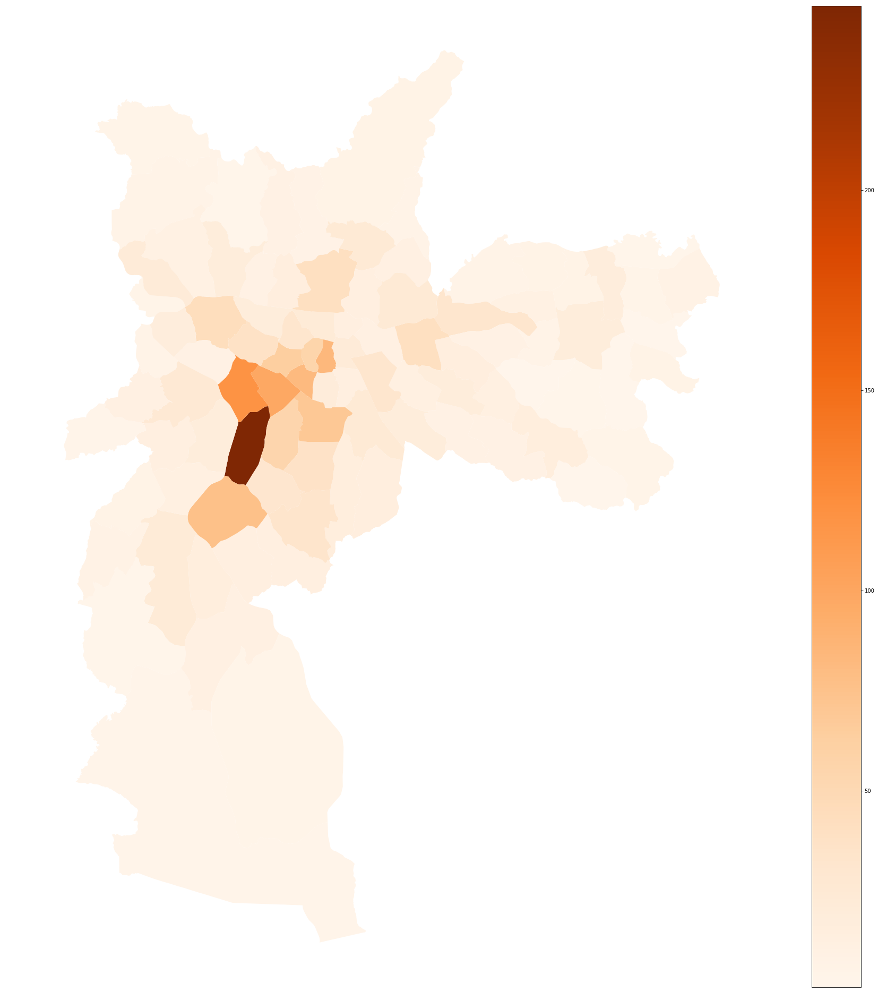

In [81]:
fig, ax = plt.subplots(figsize=(40,34))

# Set bg colors
ax.set(facecolor = "white")
fig.patch.set_facecolor('white')

# Plot
sp_shp_agg.plot(column='contagem', cmap="Oranges", legend=True, ax=ax)

ax.axis("off")
plt.show()